# Entrenamiento detección de maduración de tomates

## Imports

In [ ]:
import sys, os, distutils.core
from IPython.display import clear_output

!python -m pip install pyyaml==5.1
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))
clear_output()

In [ ]:
import torch, detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import numpy as np
import os, json, cv2, random
from IPython import display
import PIL
import matplotlib.pyplot as plt


from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

SEED = 10
THRESHOLD = 0.8

In [ ]:
!git clone 'https://github.com/vazuniga1/Taller-grupo4.git'

Cloning into 'Taller-grupo4'...
remote: Enumerating objects: 664, done.
remote: Counting objects: 100% (664/664), done.
remote: Compressing objects: 100% (651/651), done.
remote: Total 664 (delta 35), reused 2 (delta 0), pack-reused 0
Receiving objects: 100% (664/664), 163.75 MiB | 19.13 MiB/s, done.
Resolving deltas: 100% (35/35), done.
Updating files: 100% (562/562), done.


## Creación dataset

In [ ]:
from detectron2.data.datasets import register_coco_instances
from detectron2.structures import BoxMode


register_coco_instances(f"tomato_dataset_train", {},
                        f"Taller-grupo4/dataset/annotations/tomatOD_train.json",
                        f"Taller-grupo4/dataset/images/train")

register_coco_instances(f"tomato_dataset_test", {},
                        f"Taller-grupo4/dataset/annotations/ADJUSTED_tomatOD_test.json",
                        f"Taller-grupo4/dataset/images/val")

### Ejemplos de dataset

In [ ]:
import random
from detectron2.utils.visualizer import Visualizer

my_dataset_train_metadata = MetadataCatalog.get("tomato_dataset_train")
train_dataset_dicts = DatasetCatalog.get("tomato_dataset_train")

def random_images(dataset_dict,dataset_metadata, image_scale = 0.7):
    # Toma de dos imagenes random
    images = np.random.permutation(dataset_dict)[:2]
    fig, axs = plt.subplots(1,2, figsize = (12,6), dpi = 100)

    # Se plotean
    for i in range(2):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        visualizer = Visualizer(img, metadata= dataset_metadata, scale=image_scale)
        vis = visualizer.draw_dataset_dict(im)
        final_img = vis.get_image()

        axs[i].set_title('image id: ' + str(img_id), fontsize = 10)
        axs[i].axis('off')
        axs[i].imshow(final_img)

[06/25 17:17:20 d2.data.datasets.coco]: Loaded 222 images in COCO format from Taller-grupo4/dataset/annotations/tomatOD_train.json


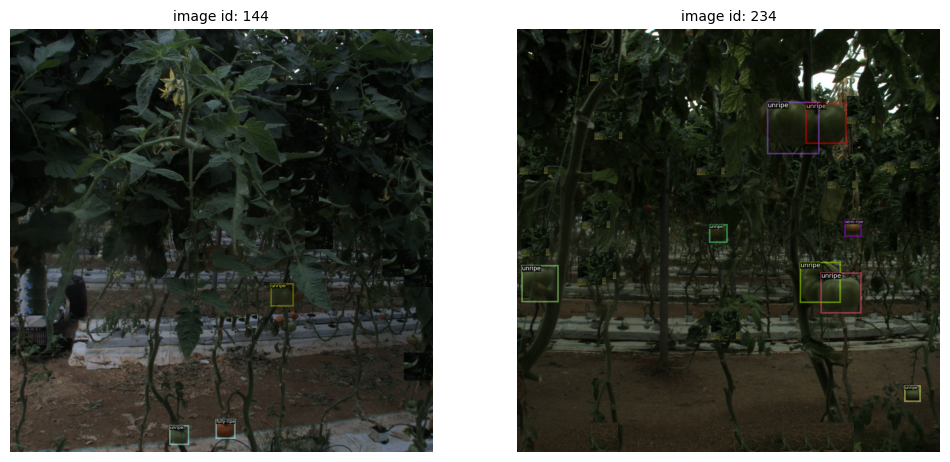

In [ ]:
random_images(train_dataset_dicts, my_dataset_train_metadata, 1)

## Entrenamiento

In [ ]:
from detectron2.engine import DefaultTrainer

# Parametros
EPOCHS = 2_700
NUM_CLASSES = 3
BASE_LR = 0.001 # aca era 0.0001

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("tomato_dataset_train")
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = BASE_LR
cfg.SOLVER.MAX_ITER = EPOCHS
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512 # era 512 aca
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[06/25 17:17:26 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f6e8b1.pkl: 243MB [00:01, 170MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[06/25 17:17:28 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[06/25 17:17:44 d2.utils.events]:  eta: 0:23:47  iter: 19  total_loss: 1.799  loss_cls: 1.164  loss_box_reg: 0.5188  loss_rpn_cls: 0.08483  loss_rpn_loc: 0.03557    time: 0.5383  last_time: 0.4479  data_time: 0.0377  last_data_time: 0.0053   lr: 1.9981e-05  max_mem: 2386M
[06/25 17:17:58 d2.utils.events]:  eta: 0:23:22  iter: 39  total_loss: 1.725  loss_cls: 0.9429  loss_box_reg: 0.6699  loss_rpn_cls: 0.07263  loss_rpn_loc: 0.04583    time: 0.5335  last_time: 0.5269  data_time: 0.0304  last_data_time: 0.0158   lr: 3.9961e-05  max_mem: 2387M
[06/25 17:18:09 d2.utils.events]:  eta: 0:23:11  iter: 59  total_loss: 1.364  loss_cls: 0.6537  loss_box_reg: 0.6346  loss_rpn_cls: 0.04408  loss_rpn_loc: 0.04133    time: 0.5323  last_time: 0.5847  data_time: 0.0151  last_data_time: 0.0812   lr: 5.9941e-05  max_mem: 2389M
[06/25 17:18:19 d2.utils.events]:  eta: 0:22:38  iter: 79  total_loss: 1.324  loss_cls: 0.5714  loss_box_reg: 0.691  loss_rpn_cls: 0.02089  loss_rpn_loc: 0.0402    time: 0.5229  l

## Save training

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = THRESHOLD
predictor = DefaultPredictor(cfg)

import pickle
with open("cfg.pkl", "wb") as f:
    pickle.dump(cfg, f)

[06/25 17:41:31 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


## Metricas

In [ ]:
def reading_metrics_from_json(metrics_path):
    metrics = []

    with open(metrics_path, 'r') as f:
        for line in f:
            metrics.append(json.loads(line))
    return metrics


def metric(metrics, specific_metric):
    metric = []
    for i in range(len(metrics)):
        metric.append(metrics[i][specific_metric])
    return metric

In [ ]:
train_metrics = reading_metrics_from_json('/content/output/metrics.json')

iters = metric(train_metrics, 'iteration')
total_loss = metric(train_metrics, 'total_loss')
cls_acc = metric(train_metrics, 'fast_rcnn/cls_accuracy')
false_neg = metric(train_metrics, 'fast_rcnn/false_negative')
loss_box_reg = metric(train_metrics, 'loss_box_reg')

Text(0.5, 1.0, 'False Negative')

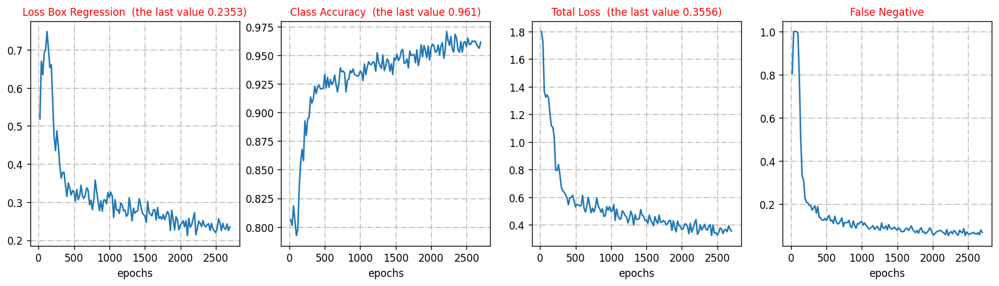

In [ ]:
fig, axs = plt.subplots(1,4, figsize = (17, 4), dpi = 120)

axs[0].grid(linestyle = 'dashdot')
axs[0].plot(iters, loss_box_reg)
axs[0].set_xlabel('epochs', fontsize = 10)
axs[0].set_title('Loss Box Regression', fontsize = 10)
tit0 = ' (the last value {0:.4f})'.format(loss_box_reg[-1])
axs[0].set_title('Loss Box Regression ' + tit0, fontsize = 10, color = 'red')

axs[1].grid(linestyle = 'dashdot')
axs[1].plot(iters, cls_acc)
axs[1].set_xlabel('epochs', fontsize = 10)
tit1 = ' (the last value {0:.3f})'.format(cls_acc[-1])
axs[1].set_title('Class Accuracy ' + tit1, fontsize = 10, color = 'red')

axs[2].grid(linestyle = 'dashdot')
axs[2].plot(iters, total_loss)
axs[2].set_xlabel('epochs', fontsize = 10)
tit2 = ' (the last value {0:.4f})'.format(total_loss[-1])
axs[2].set_title('Total Loss ' + tit2, fontsize = 10, color = 'red')

axs[3].grid(linestyle = 'dashdot')
axs[3].plot(iters, false_neg)
axs[3].set_xlabel('epochs', fontsize = 10)
axs[3].set_title('False Negative', fontsize = 10, color = 'red')

In [ ]:
from detectron2.utils.visualizer import ColorMode
import matplotlib.pyplot as plt

# Diccionario y metadata del dataset
my_dataset_test_metadata = MetadataCatalog.get("tomato_dataset_test")
dataset_dicts = DatasetCatalog.get("tomato_dataset_test")

def create_predictions(dataset_dict, dataset_metadata, num_samples, image_scale = 0.6):
    """
    Funcion para visualizar las predicciones, se muestran las etiquetas originales
    a la izquierda y las predicciones a la derecha

    Args:
    dataset_dict: dict
    dataset_metadata: metadata
    """
    # Seleccion random de imagenes
    images = np.random.permutation(dataset_dict)[:num_samples]

    # Se plotea
    fig, axs = plt.subplots(num_samples, 2, figsize = (20,20), dpi = 120)
    for i in range(3):
        img = images[i]
        img_path, img_id = img['file_name'], img['image_id']

        # Se plotea imagen original y se obtiene sus anotaciones
        image = cv2.imread(img_path)
        plt.imshow(image)
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        visualizer1 = Visualizer(image, metadata= dataset_metadata, scale=image_scale)
        vis_original = visualizer1.draw_dataset_dict(img)
        original_bbox = vis_original.get_image()

        axs[i][0].set_title('original bbox (id: ' + str(img_id) +')', fontsize = 20)
        axs[i][0].axis('off')
        axs[i][0].imshow(original_bbox)

        # Se realiza la predicción
        visualizer2 = Visualizer(image, metadata= dataset_metadata, scale=image_scale)
        outputs = predictor(image)
        out = visualizer2.draw_instance_predictions(outputs["instances"].to("cpu"))
        out_img = cv2.cvtColor(out.get_image(), cv2.COLOR_BGR2RGB)
        final_bbox = cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB)

        axs[i][1].set_title('predicted bbox (id: ' + str(img_id) +')', fontsize = 20, color = 'red')
        axs[i][1].axis('off')
        axs[i][1].imshow(final_bbox)

    fig.tight_layout()

[06/25 17:41:38 d2.data.datasets.coco]: Loaded 55 images in COCO format from Taller-grupo4/dataset/annotations/ADJUSTED_tomatOD_test.json


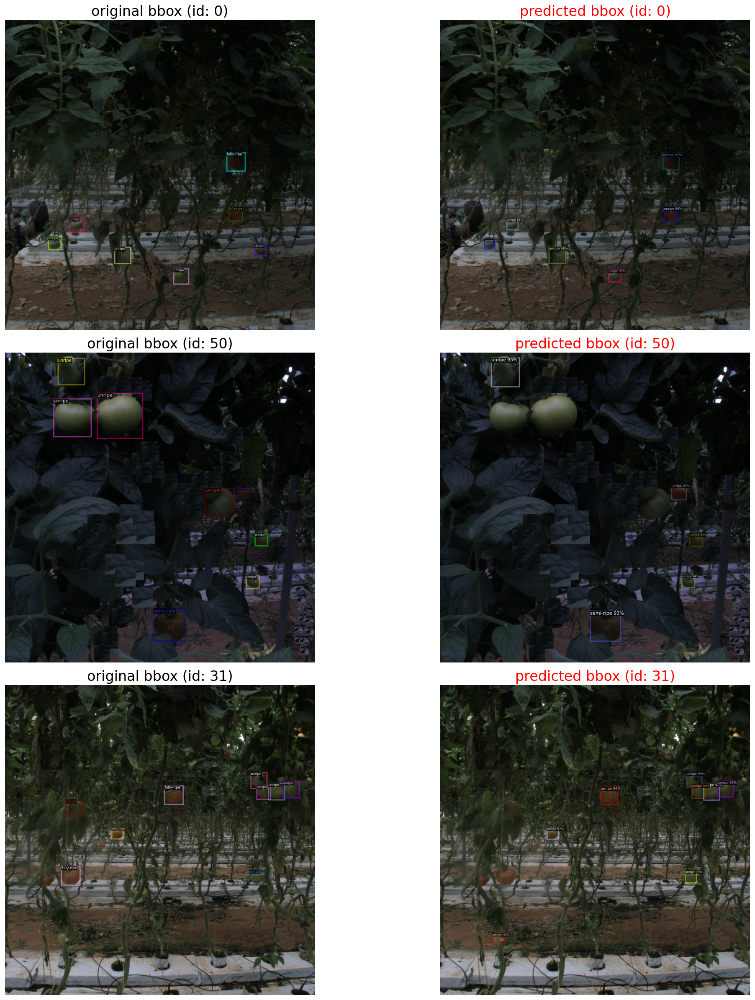

In [ ]:
create_predictions(dataset_dicts,my_dataset_test_metadata, num_samples = 3)

## Predicciones de tomates random

In [ ]:
def prediccion_random(image_path):
  """
  Se realiza una predicción de una foto de un tomate introducida.
  Se retorna la foto del tomate con las bounding box predecidas

  Params:
  image_path: Path de la foto del tomate
  """
  # Se lee la imagen
  image = cv2.imread(image_path)

  # Realizamos la prediccion
  outputs = predictor(image)

  # Visualizamos los resultados
  v = Visualizer(image, metadata= my_dataset_test_metadata, scale=3)
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  out_img = cv2.cvtColor(out.get_image(), cv2.COLOR_BGR2RGB)

  # Se lee la imagen original
  original_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  # Se plotea
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
  ax1.imshow(original_img)
  ax1.set_title('Original')
  ax1.axis('off')
  ax2.imshow(out_img)
  ax2.set_title('Predicción')
  ax2.axis('off')
  plt.tight_layout()
  plt.show()

  # Retornamos el resultado
  return out_img

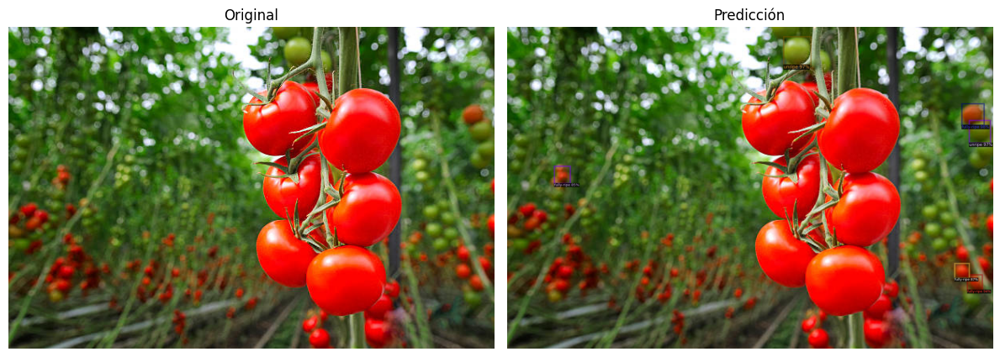

In [ ]:
ex1 = prediccion_random("/content/tomate.jpg")

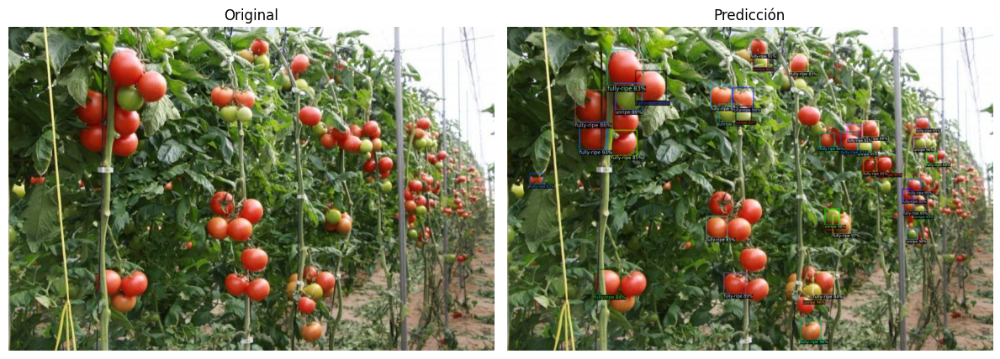

In [ ]:
ex2 = prediccion_random("/content/tomates.jpg")

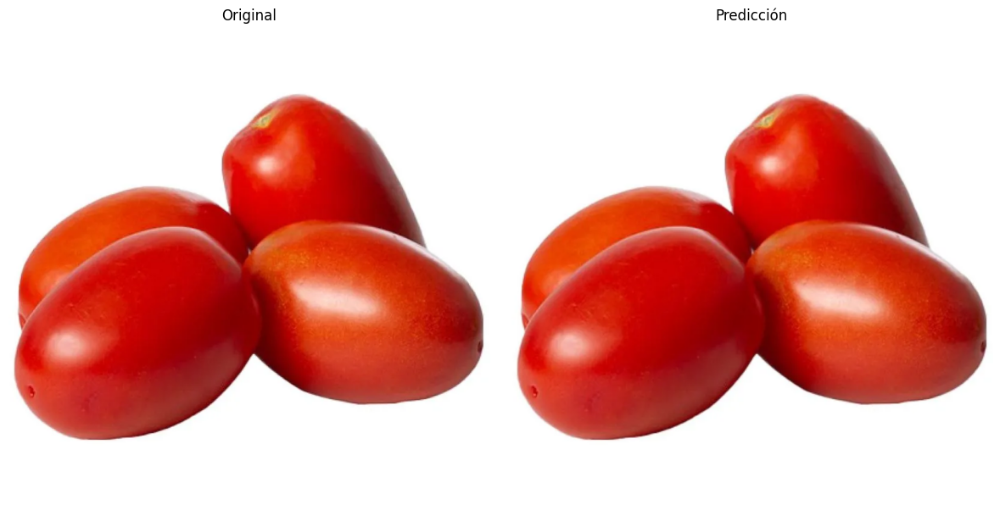

In [ ]:
ex3 = prediccion_random("/content/tomatitos.webp")

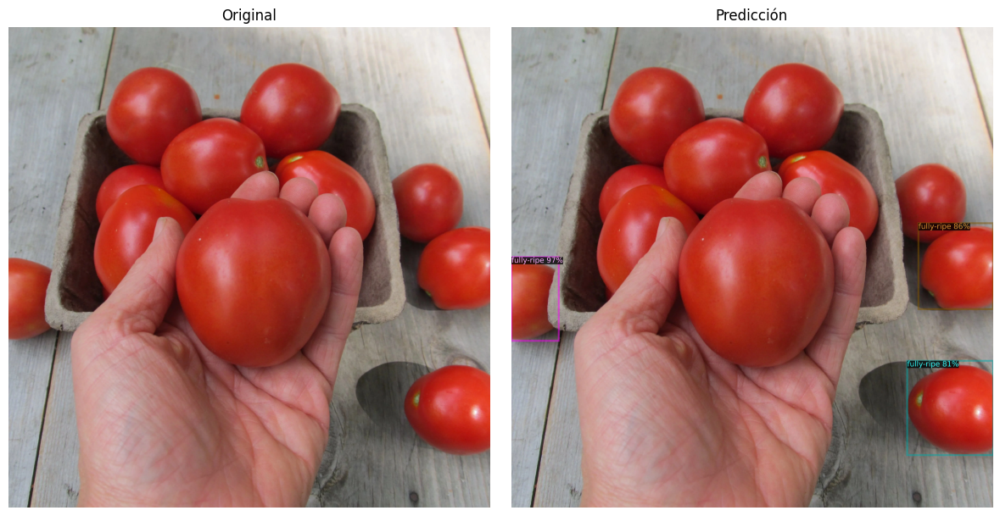

In [ ]:
ex4 = prediccion_random("/content/tomatess.webp")

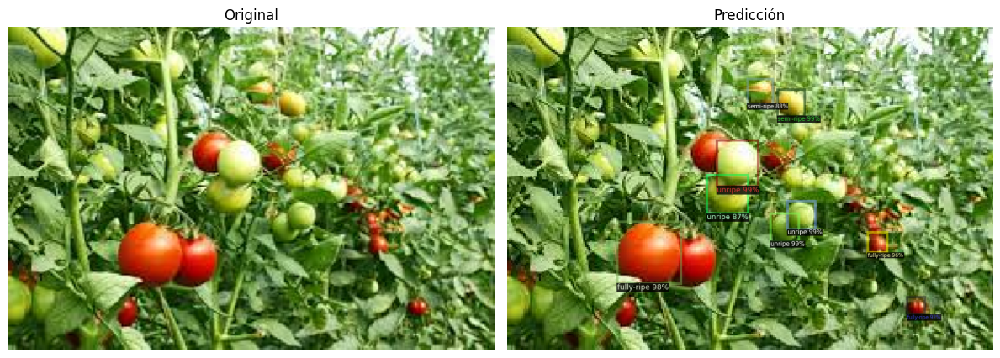

In [ ]:
ex5 = prediccion_random("/content/images.jpeg")

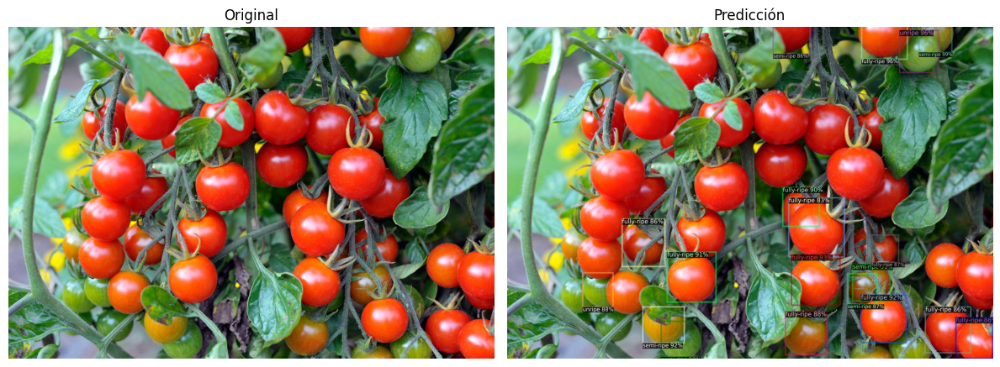

In [ ]:
ex6 = prediccion_random("/content/bC3PaydhcXxKMFYn3ZuMj5.jpg")